In [1]:
# !pip install autokeras


In [2]:
import numpy as np
import pandas as pd
import tensorflow as tf

import logging
logging.getLogger('tensorflow').disabled = True

from sklearn.datasets import load_files
import autokeras as ak

import plotly.express as px
import copy 
import os
import json

from mylib import plot_roc, plot_pr_curve, plot_roc_train_test, plot_pr_train_test, hyper_table, predic_error_analysis, plot_pr_multi_class

## A Simple Example
The first step is to prepare your data. Here we use the [IMDB
dataset](https://keras.io/datasets/#imdb-movie-reviews-sentiment-classification)
as an example.


In [3]:
dataset = tf.keras.utils.get_file(
    fname="aclImdb.tar.gz",
    origin="http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz",
    extract=True,
)

# set path to dataset
IMDB_DATADIR = os.path.join(os.path.dirname(dataset), "aclImdb")

classes = ["pos", "neg"]
train_data = load_files(
    os.path.join(IMDB_DATADIR, "train"), shuffle=True, categories=classes
)
test_data = load_files(
    os.path.join(IMDB_DATADIR, "test"), shuffle=False, categories=classes
)

x_train = np.array(train_data.data)
y_train = np.array(train_data.target)
x_test = np.array(test_data.data)
y_test = np.array(test_data.target)

print(x_train.shape)  # (25000,)
print(y_train.shape)  # (25000, 1)
print(x_train[0][:50])  # this film was just brilliant casting

(25000,)
(25000,)
b'Zero Day leads you to think, even re-think why two'


In [4]:
train_df = pd.DataFrame(zip(train_data.data, train_data.target), columns = ['data','target'])
test_df = pd.DataFrame(zip(test_data.data, test_data.target), columns = ['data','target'])
display(train_df)

,data,target
0,"b""Zero Day leads you to think, even re-think w...",1
1,b'Words can\'t describe how bad this movie is....,0
2,b'Everyone plays their part pretty well in thi...,1
3,b'There are a lot of highly talented filmmaker...,0
4,b'I\'ve just had the evidence that confirmed m...,0
...,...,...
24995,b'089: Footlight Parade (1933) - released 9/30...,1
24996,b'Deeply humorous yet honest comedy about a bu...,1
24997,b'1st watched 2/28/2006 - 4 out of 10(Dir-Sydn...,0
24998,"b""I watch lots of scary movies (or at least th...",0


The second step is to run the [TextClassifier](/text_classifier).  As a quick
demo, we set epochs to 2.  You can also leave the epochs unspecified for an
adaptive number of epochs.


In [5]:
# Initialize the text classifier.
clf = ak.TextClassifier(
    overwrite=True, max_trials=2
)  # It only tries 1 model as a quick demo.
# Feed the text classifier with training data.
clf.fit(x_train, y_train, epochs=2)
# Predict with the best model.
predicted_y = clf.predict(x_test)
# Evaluate the best model with testing data.
print(clf.evaluate(x_test, y_test))

Trial 2 Complete [00h 00m 44s]
val_loss: 0.3216502368450165

Best val_loss So Far: 0.2789009213447571
Total elapsed time: 00h 01m 19s
Epoch 1/2
782/782 [==============================] - 19s 23ms/step - loss: 0.5620 - accuracy: 0.6606
Epoch 2/2
782/782 [==============================] - 6s 7ms/step - loss: 0.2760 - accuracy: 0.8900
[0.27597445249557495, 0.889959990978241]


,trial#1,trial#2
text_block_1/block_type,transformer,vanilla
classification_head_1/dropout,0,0
optimizer,adam,adam
learning_rate,0.001,0.001
text_block_1/max_tokens,20000,5000
text_block_1/text_to_int_sequence_1/output_sequence_length,200,512
text_block_1/transformer_1/pretraining,none,NaN
text_block_1/transformer_1/embedding_dim,32,NaN
text_block_1/transformer_1/num_heads,2,NaN
text_block_1/transformer_1/dense_dim,32,NaN


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None,)]                 0         
_________________________________________________________________
expand_last_dim (ExpandLastD (None, 1)                 0         
_________________________________________________________________
text_vectorization (TextVect (None, 512)               0         
_________________________________________________________________
embedding (Embedding)        (None, 512, 64)           320064    
_________________________________________________________________
dropout (Dropout)            (None, 512, 64)           0         
_________________________________________________________________
conv1d (Conv1D)              (None, 508, 256)          82176     
_________________________________________________________________
global_max_pooling1d (Global (None, 256)               0     

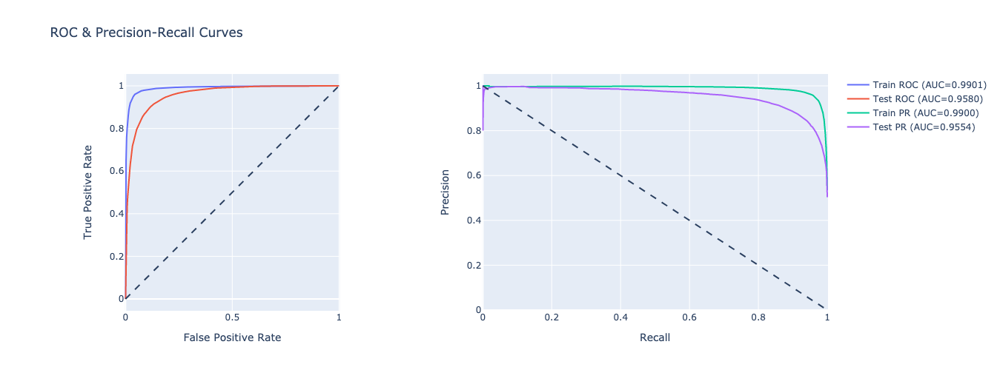

In [6]:
# performance of the model
display(hyper_table(path='text_classifier'))

model = clf.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

plot_pr_train_test(y_train, y_score_train, y_test, y_score)

## Validation Data
By default, AutoKeras use the last 20% of training data as validation data.  As
shown in the example below, you can use `validation_split` to specify the
percentage.


In [7]:
clf.fit(
    x_train,
    y_train,
    # Split the training data and use the last 15% as validation data.
    validation_split=0.15,
)


You can also use your own validation set instead of splitting it from the
training data with `validation_data`.


In [8]:
split = 5000
x_val = x_train[split:]
y_val = y_train[split:]
x_train = x_train[:split]
y_train = y_train[:split]
clf.fit(
    x_train,
    y_train,
    epochs=2,
    # Use your own validation set.
    validation_data=(x_val, y_val),
)


## Customized Search Space
For advanced users, you may customize your search space by using
[AutoModel](/auto_model/#automodel-class) instead of
[TextClassifier](/text_classifier). You can configure the
[TextBlock](/block/#textblock-class) for some high-level configurations, e.g.,
`vectorizer` for the type of text vectorization method to use.  You can use
'sequence', which uses [TextToInteSequence](/block/#texttointsequence-class) to
convert the words to integers and use [Embedding](/block/#embedding-class) for
embedding the integer sequences, or you can use 'ngram', which uses
[TextToNgramVector](/block/#texttongramvector-class) to vectorize the
sentences.  You can also do not specify these arguments, which would leave the
different choices to be tuned automatically.  See the following example for
detail.


Trial 1 Complete [00h 00m 22s]
val_loss: 0.352662056684494

Best val_loss So Far: 0.352662056684494
Total elapsed time: 00h 00m 22s
Epoch 1/2
157/157 [==============================] - 10s 60ms/step - loss: 0.5979 - accuracy: 0.6883
Epoch 2/2
157/157 [==============================] - 9s 60ms/step - loss: 0.2093 - accuracy: 0.9258


,trial#1
text_block_1/max_tokens,5000
text_block_1/text_to_ngram_vector_1/ngrams,2
text_block_1/dense_block_1/use_batchnorm,False
text_block_1/dense_block_1/num_layers,2
text_block_1/dense_block_1/units_0,32
text_block_1/dense_block_1/dropout,0
text_block_1/dense_block_1/units_1,32
classification_head_1/dropout,0
optimizer,adam
learning_rate,0.001


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None,)]                 0         
_________________________________________________________________
expand_last_dim (ExpandLastD (None, 1)                 0         
_________________________________________________________________
text_vectorization (TextVect (None, 5000)              0         
_________________________________________________________________
dense (Dense)                (None, 32)                160032    
_________________________________________________________________
re_lu (ReLU)                 (None, 32)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 32)                1056      
_________________________________________________________________
re_lu_1 (ReLU)               (None, 32)                0     

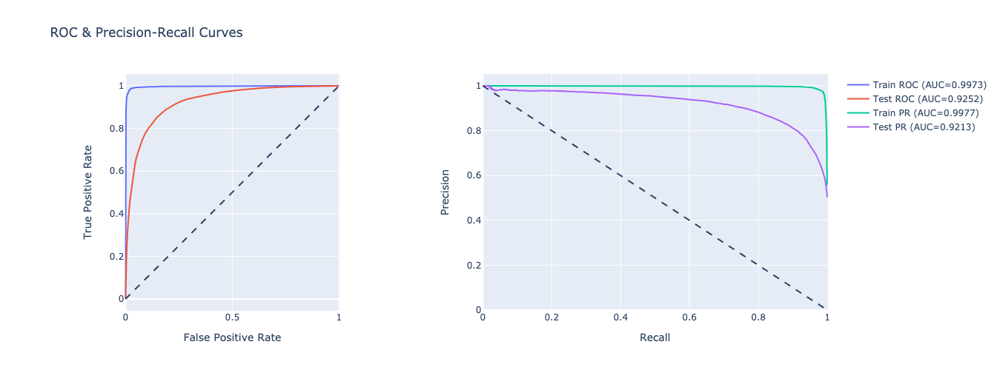

In [9]:

input_node = ak.TextInput()
output_node = ak.TextBlock(block_type="ngram")(input_node)
output_node = ak.ClassificationHead()(output_node)
clf = ak.AutoModel(
    inputs=input_node, outputs=output_node, overwrite=True, max_trials=1
)
clf.fit(x_train, y_train, epochs=2)

# performance of the model
display(hyper_table(path='auto_model'))

model = clf.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

plot_pr_train_test(y_train, y_score_train, y_test, y_score)

The usage of [AutoModel](/auto_model/#automodel-class) is similar to the
[functional API](https://www.tensorflow.org/guide/keras/functional) of Keras.
Basically, you are building a graph, whose edges are blocks and the nodes are
intermediate outputs of blocks.  To add an edge from `input_node` to
`output_node` with `output_node = ak.[some_block]([block_args])(input_node)`.

You can even also use more fine grained blocks to customize the search space
even further. See the following example.


Trial 1 Complete [00h 00m 05s]
val_loss: 0.6931505799293518

Best val_loss So Far: 0.6931505799293518
Total elapsed time: 00h 00m 05s
Epoch 1/2
157/157 [==============================] - 3s 14ms/step - loss: 0.6932 - accuracy: 0.4769
Epoch 2/2
157/157 [==============================] - 2s 14ms/step - loss: 0.6932 - accuracy: 0.4971


,trial#1
text_to_int_sequence_1/output_sequence_length,64
embedding_1/pretraining,none
embedding_1/embedding_dim,128
embedding_1/dropout,0.25
conv_block_1/kernel_size,3
conv_block_1/max_pooling,True
conv_block_1/dropout,0
conv_block_1/num_blocks,2
conv_block_1/num_layers,2
conv_block_1/filters_0_0,32


Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None,)]                 0         
_________________________________________________________________
expand_last_dim (ExpandLastD (None, 1)                 0         
_________________________________________________________________
text_vectorization (TextVect (None, 64)                0         
_________________________________________________________________
embedding (Embedding)        (None, 64, 128)           2560128   
_________________________________________________________________
dropout (Dropout)            (None, 64, 128)           0         
_________________________________________________________________
separable_conv1d (SeparableC (None, 62, 32)            4512      
_________________________________________________________________
separable_conv1d_1 (Separabl (None, 60, 32)            1152  

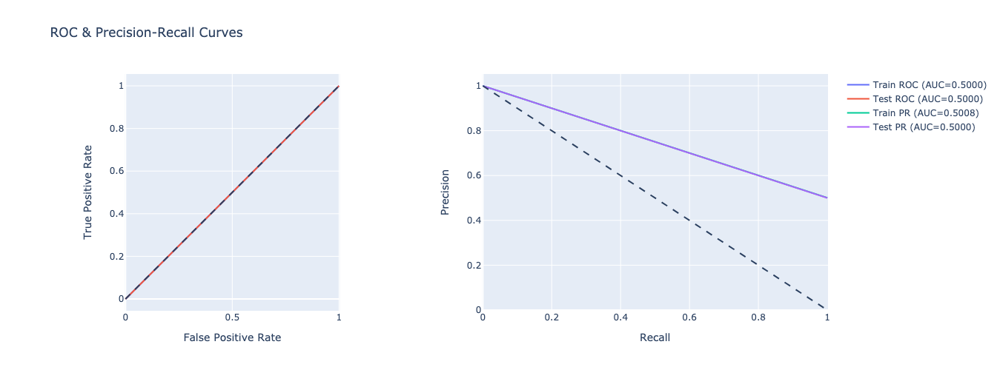

In [10]:

input_node = ak.TextInput()
output_node = ak.TextToIntSequence()(input_node)
output_node = ak.Embedding()(output_node)
# Use separable Conv layers in Keras.
output_node = ak.ConvBlock(separable=True)(output_node)
output_node = ak.ClassificationHead()(output_node)
clf = ak.AutoModel(
    inputs=input_node, outputs=output_node, overwrite=True, max_trials=1
)
clf.fit(x_train, y_train, epochs=2)

# performance of the model
display(hyper_table(path='auto_model'))

model = clf.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

plot_pr_train_test(y_train, y_score_train, y_test, y_score)

## Data Format
The AutoKeras TextClassifier is quite flexible for the data format.

For the text, the input data should be one-dimensional For the classification
labels, AutoKeras accepts both plain labels, i.e. strings or integers, and
one-hot encoded encoded labels, i.e. vectors of 0s and 1s.

We also support using [tf.data.Dataset](
https://www.tensorflow.org/api_docs/python/tf/data/Dataset?version=stable)
format for the training data.


In [11]:
train_set = tf.data.Dataset.from_tensor_slices(((x_train,), (y_train,))).batch(32)
test_set = tf.data.Dataset.from_tensor_slices(((x_test,), (y_test,))).batch(32)

clf = ak.TextClassifier(overwrite=True, max_trials=2)
# Feed the tensorflow Dataset to the classifier.
clf.fit(train_set, epochs=2)
# Predict with the best model.
predicted_y = clf.predict(test_set)
# Evaluate the best model with testing data.
print(clf.evaluate(test_set))

Trial 2 Complete [00h 00m 10s]
val_loss: 0.3885456919670105

Best val_loss So Far: 0.3885456919670105
Total elapsed time: 00h 00m 18s
Epoch 1/2
157/157 [==============================] - 6s 29ms/step - loss: 0.6982 - accuracy: 0.5282
Epoch 2/2
782/782 [==============================] - 9s 11ms/step - loss: 0.3849 - accuracy: 0.8326
[0.38487160205841064, 0.8325600028038025]


,trial#1,trial#2
text_block_1/block_type,transformer,vanilla
classification_head_1/dropout,0,0
optimizer,adam,adam
learning_rate,0.001,0.001
text_block_1/max_tokens,20000,5000
text_block_1/text_to_int_sequence_1/output_sequence_length,200,512
text_block_1/transformer_1/pretraining,none,NaN
text_block_1/transformer_1/embedding_dim,32,NaN
text_block_1/transformer_1/num_heads,2,NaN
text_block_1/transformer_1/dense_dim,32,NaN


Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None,)]            0                                            
__________________________________________________________________________________________________
expand_last_dim (ExpandLastDim) (None, 1)            0           input_1[0][0]                    
__________________________________________________________________________________________________
text_vectorization (TextVectori (None, 200)          0           expand_last_dim[0][0]            
__________________________________________________________________________________________________
tf.compat.v1.shape (TFOpLambda) (2,)                 0           text_vectorization[0][0]         
______________________________________________________________________________________________

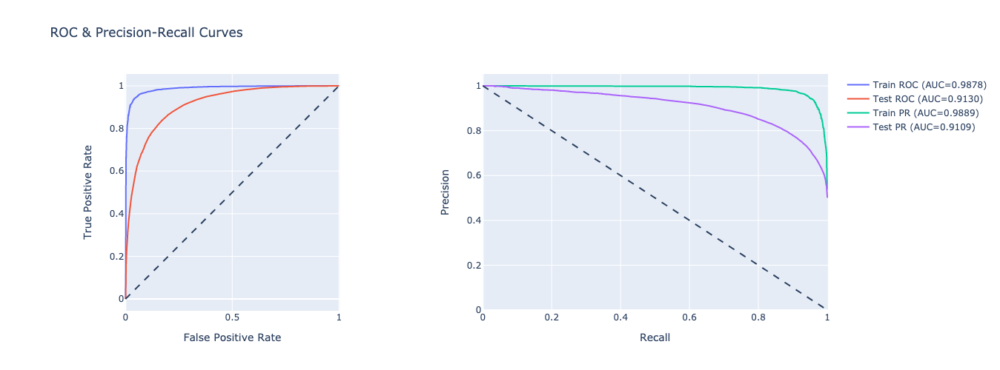

In [12]:
# performance of the model
display(hyper_table(path='text_classifier'))

model = clf.export_model()
model.summary()

y_score = model.predict(x_test)
y_score_train = model.predict(x_train)

plot_pr_train_test(y_train, y_score_train, y_test, y_score)